In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [113]:
!pip install opencv-python
import cv2
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import math
from google.colab.patches import cv2_imshow
from sklearn.decomposition import PCA

# LOAD DATA

In [115]:
def load_dataset(folder):
    images = {}
    for person_name in os.listdir(folder):
        person_dir = os.path.join(folder, person_name)
        if os.path.isdir(person_dir):
            for image_name in os.listdir(person_dir):
                image_path = os.path.join(person_dir, image_name)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if image is not None:
                    images[person_name + '/' + image_name] = image
    return images

In [116]:
folder = '/content/drive/MyDrive/Project  Face recognition/Demo/ATM images'
faces = load_dataset(folder)

In [119]:
def show_images(images):
    n = len(images)
    cols = 3
    rows = (n + cols - 1) // cols
    fig, ax = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
    for i, (label, image) in enumerate(images.items()):
        r, c = divmod(i, cols)
        ax[r, c].imshow(image, cmap='gray')
        ax[r, c].set_title(label)
        ax[r, c].axis('off')
    for j in range(i+1, rows*cols):
        r, c = divmod(j, cols)
        ax[r, c].axis('off')
    plt.tight_layout()
    plt.show()

In [120]:
show_images(faces)

# FACE DETECTION

> Use a pretrained model OpenCV's Haar cascades to detect faces in the input image.



In [121]:
cascade_path = '/content/drive/MyDrive/Project  Face recognition/Demo/haarcascade_frontalface_default (1).xml'

In [128]:
def detect_faces(images):
    face_cascade = cv2.CascadeClassifier(cascade_path)
    detected_faces = {}
    for filename, image in images.items():
        faces = face_cascade.detectMultiScale(image, 1.1, 4)
        for (x, y, w, h) in faces:
            detected_faces[filename] = image[y:y+h, x:x+w]
            break
    return detected_faces


In [129]:
faces = detect_faces(faces)

In [135]:
def resize_face(face, target_size=(200, 200)):
    return cv2.resize(face, target_size)

def create_facematrix_and_labels(detected_faces, target_size=(200, 200)):
    facematrix = []
    facelabel = []

    for filename, face in detected_faces.items():
        resized_face = resize_face(face, target_size)
        facematrix.append(resized_face.flatten())
        label = filename.split('/')[0]
        facelabel.append(label)

    facematrix = np.array(facematrix, dtype='float32')

    return facematrix, facelabel


In [136]:
facematrix, facelabel = create_facematrix_and_labels(faces)

In [137]:
pca = PCA().fit(facematrix)

In [138]:
n_components = 50
eigenfaces = pca.components_[:n_components]

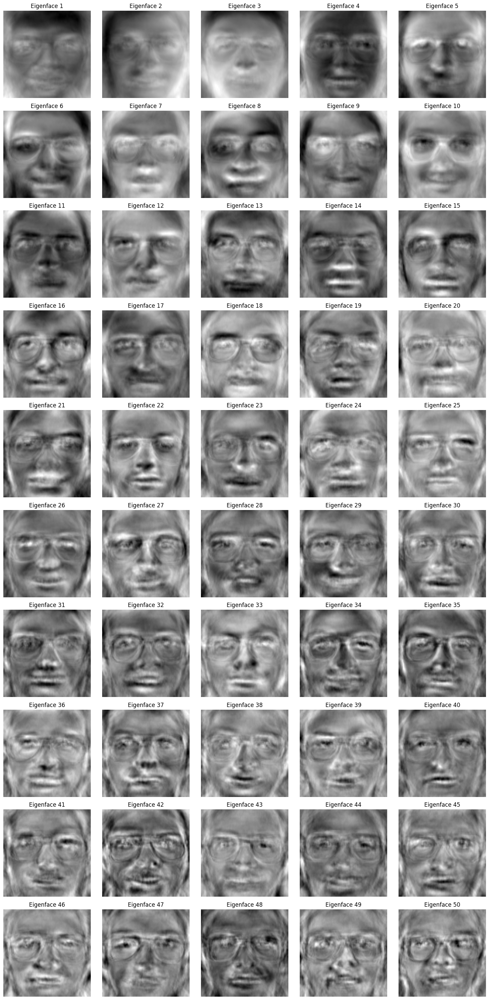

In [140]:
original_shape = (200, 200)

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(15, 30))
for i, ax in enumerate(axes.flat):
    if i < n_components:
        eigenface = eigenfaces[i].reshape(original_shape)
        ax.imshow(eigenface, cmap='gray')
        ax.set_title(f"Eigenface {i+1}")
        ax.axis('off')

plt.tight_layout()
plt.show()


In [147]:
faceshape = list(faces.values())[0].shape
print("Face image shape:", faceshape)

Face image shape: (80, 80)


In [151]:
# In ra một số keys đầu tiên từ từ điển faces
print(list(faces.keys()))


['s1/3.pgm', 's1/1.pgm', 's1/9.pgm', 's1/7.pgm', 's1/8.pgm', 's1/10.pgm', 's17/8.pgm', 's17/1.pgm', 's17/3.pgm', 's17/9.pgm', 's17/2.pgm', 's17/6.pgm', 's17/4.pgm', 's17/5.pgm', 's12/9.pgm', 's12/1.pgm', 's12/5.pgm', 's12/10.pgm', 's12/7.pgm', 's12/6.pgm', 's12/4.pgm', 's12/3.pgm', 's12/2.pgm', 's12/8.pgm', 's15/1.pgm', 's15/8.pgm', 's15/7.pgm', 's15/3.pgm', 's15/9.pgm', 's15/4.pgm', 's15/2.pgm', 's15/5.pgm', 's15/10.pgm', 's15/6.pgm', 's14/7.pgm', 's14/1.pgm', 's14/6.pgm', 's14/3.pgm', 's14/9.pgm', 's14/2.pgm', 's14/5.pgm', 's14/4.pgm', 's14/10.pgm', 's14/8.pgm', 's13/4.pgm', 's13/2.pgm', 's13/9.pgm', 's13/8.pgm', 's13/5.pgm', 's13/10.pgm', 's13/7.pgm', 's13/1.pgm', 's13/6.pgm', 's11/7.pgm', 's11/3.pgm', 's11/5.pgm', 's11/2.pgm', 's11/10.pgm', 's11/1.pgm', 's11/4.pgm', 's11/9.pgm', 's11/8.pgm', 's11/6.pgm', 's10/10.pgm', 's10/2.pgm', 's10/7.pgm', 's10/5.pgm', 's10/1.pgm', 's10/3.pgm', 's10/4.pgm', 's10/6.pgm', 's10/8.pgm', 's16/9.pgm', 's16/10.pgm', 's16/2.pgm', 's16/4.pgm', 's16/3.pg

In [158]:
weights = eigenfaces @ (facematrix - pca.mean_).T

In [163]:
def find_best_match_for_query(query_img):
  query_img_resized = cv2.resize(query_img, (200, 200))
  query_img_flattened = query_img_resized.reshape(1, -1)

  query_weight = eigenfaces @ (query_img_flattened - pca.mean_).T

  euclidean_distance = np.linalg.norm(weights - query_weight, axis=0)

  best_match = np.argmin(euclidean_distance)
  print("Best match %s with Euclidean distance %f" % (facelabel[best_match], euclidean_distance[best_match]))

  fig, axes = plt.subplots(1, 2, figsize=(8, 6))
  axes[0].imshow(query_img_resized, cmap="gray")
  axes[0].set_title("Query")
  axes[1].imshow(facematrix[best_match].reshape((200, 200)), cmap="gray")
  axes[1].set_title("Best match")
  plt.show()


Best match s16 with Euclidean distance 0.009517


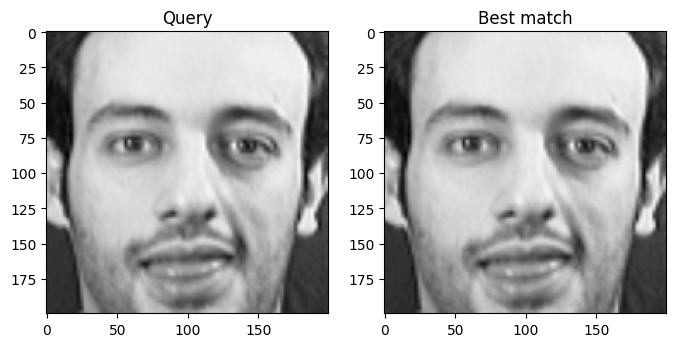

In [165]:
query_img = faces['s16/5.pgm']
find_best_match_for_query(query_img)

Best match s10 with Euclidean distance 0.009983


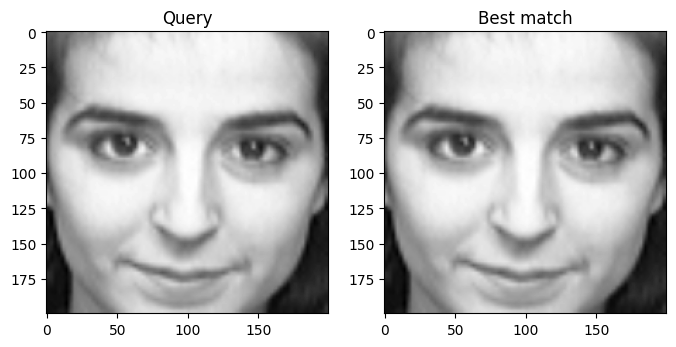

In [166]:
query_img = faces['s10/8.pgm']
find_best_match_for_query(query_img)